# Import necessary modules

In [28]:
import os
import pickle
import time

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from tqdm import tqdm

# Generator class

In [29]:
class Generator(nn.Module):
    """Image generator
    
    Takes a noise vector as input and syntheses a single channel image accordingly
    """

    def __init__(self, input_dims, output_dims):
        """Init function
        
        Declaring the network structure
        
        Arguments:
            input_dims {int} -- Dimension of input noise vector
            output_dims {int} -- Dimension of the output vector (flatten image)
        """
        super(Generator, self).__init__()
        self.fc0 = nn.Sequential(nn.Linear(input_dims, 256), nn.LeakyReLU(0.2)) # LeakyReLu solves dying ReLu problem
        self.fc1 = nn.Sequential(nn.Linear(256, 512), nn.LeakyReLU(0.2))
        self.fc2 = nn.Sequential(nn.Linear(512, 1024), nn.LeakyReLU(0.2))
        # self.fc3 = nn.Sequential(nn.Linear(1024, 784), nn.LeakyReLU(0.2))
        # output hidden layer
        self.fc3 = nn.Sequential(nn.Linear(1024, output_dims), nn.Tanh())

    def forward(self, x):
        """Forward function
        
        Arguments:
            x {Tensor} -- a batch of noise vectors in shape (<batch_size>x<input_dims>)
        
        Returns:
            Tensor -- a batch of flatten image in shape (<batch_size>x<output_dims>)
        """
        x = self.fc0(x)
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        # x = self.fc4(x)
        return x


# Discriminator class

In [30]:
class Discriminator(nn.Module):
    """Image discriminator
    
    Takes a image as input and predict if it is real from the dataset or fake synthesised by the generator
    """

    def __init__(self, input_dims, output_dims=1):
        """Init function
        
        Declaring the discriminator network structure
        
        Arguments:
            input_dims {int} -- Dimension of the flatten input images
        
        Keyword Arguments:
            output_dims {int} -- Predicted probability (default: {1})
        """
        super(Discriminator, self).__init__()

        self.fc0 = nn.Sequential(
            nn.Linear(input_dims, 1024),
            nn.LeakyReLU(0.2),
            # nn.Dropout(0.3)
        )
        self.fc1 = nn.Sequential(
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            # nn.Dropout(0.3)
        )
        self.fc2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            # nn.Dropout(0.3)
        )
        self.fc3 = nn.Sequential(
            nn.Linear(256, output_dims),
            nn.Sigmoid()
        )

    def forward(self, x):
        """Forward function
        
        Arguments:
            x {Tensor} -- a batch of 2D image in shape (<batch_size>xHxW)
        
        Returns:
            Tensor -- predicted probabilities (<batch_size>)
        """

        x = self.fc0(x)
        x = self.fc1(x)
        x = self.fc2(x)
        x = self.fc3(x)
        return x

In [31]:
def show_result(G_net, z_, num_epoch, show=False, save=False, path='result.png'):
    """Result visualisation
    
    Show and save the generated figures in the grid fashion
    
    Arguments:
        G_net {[nn.Module]} -- The generator instant
        z_ {[Tensor]} -- Input noise vectors
        num_epoch {[int]} -- Indicate how many epoch has the generator been trained
    
    Keyword Arguments:
        show {bool} -- If to display the images (default: {False})
        save {bool} -- If to store the images (default: {False})
        path {str} -- path to store the images (default: {'result.png'})
    """

    grid_size = 5

    imgs = G_net(z_)  # Generate images from the noise vector
    fig = plt.figure(figsize=(8, 8))
    columns = rows = grid_size
    # plt.title("Training Images")
    for i in range(1, columns * rows + 1):
        plt.axis("off")
        fig.add_subplot(rows, columns, i)
        # if show:
        plt.imshow(np.reshape(imgs.cpu().data.numpy()[i-1], (28, 28)), cmap='gray_r')
    if save:
        plt.savefig(path)
    if show:
        plt.show()
    # plt.pause(0.05)

In [32]:
def show_train_hist(hist, show=False, save=False, path='Train_hist.png'):
    """Loss tracker
    
    Plot the losses of generator and discriminator independently to see the trend
    
    Arguments:
        hist {[dict]} -- Tracking variables
    
    Keyword Arguments:
        show {bool} -- If to display the figure (default: {False})
        save {bool} -- If to store the figure (default: {False})
        path {str} -- path to store the figure (default: {'Train_hist.png'})
    """
    x = range(len(hist['D_losses']))

    y1 = hist['D_losses']
    y2 = hist['G_losses']

    plt.plot(x, y1, label='D_loss')
    plt.plot(x, y2, label='G_loss')

    plt.xlabel('Epoch')
    plt.ylabel('Loss')

    plt.legend(loc=4)
    plt.grid(True)
    plt.tight_layout()

    if save:
        plt.savefig(path)

    if show:
        plt.show()
    else:
        plt.close()

In [33]:
def create_noise(num, dim):
    """Noise constructor
    
    returns a tensor filled with random numbers from a standard normal distribution
    
    Arguments:
        num {int} -- Number of vectors
        dim {int} -- Dimension of vectors
    
    Returns:
        [Tensor] -- the generated noise vector batch
    """
    return torch.randn(num, dim)

# Training

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 54.78it/s]


Epoch 1 of 100 with 10.96 s
Generator loss: 2.85855369, Discriminator loss: 1.00301677


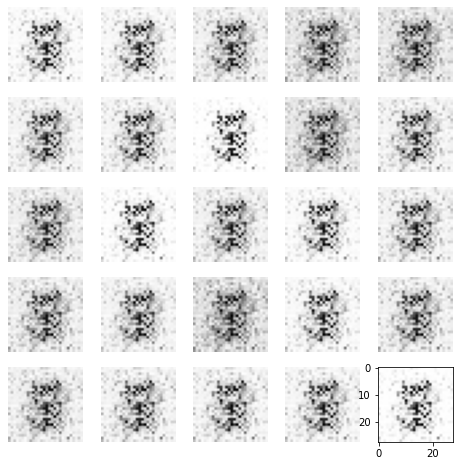

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 58.74it/s]


Epoch 2 of 100 with 10.23 s
Generator loss: 3.40286825, Discriminator loss: 0.94381179


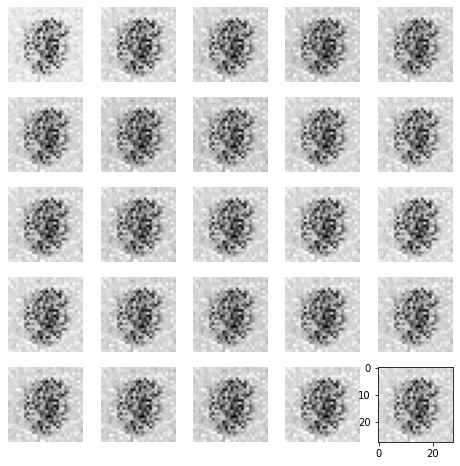

100%|██████████████████████████████████████████████████████████████| 600/600 [00:09<00:00, 60.28it/s]

Epoch 3 of 100 with 9.96 s
Generator loss: 32.49426760, Discriminator loss: 1.59622957


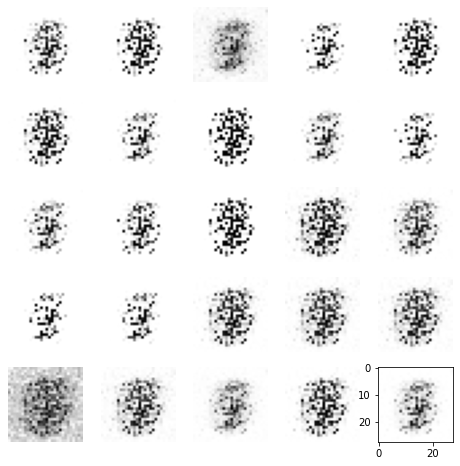

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.62it/s]


Epoch 4 of 100 with 10.79 s
Generator loss: 5.84181530, Discriminator loss: 1.05672341


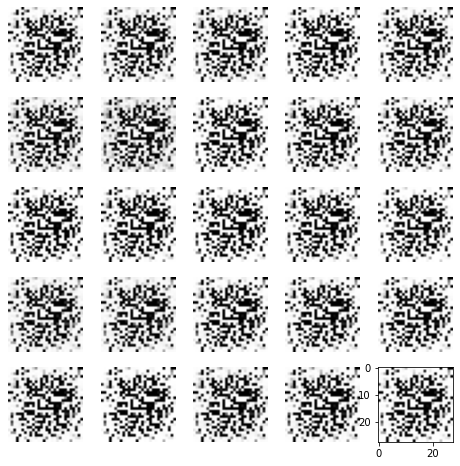

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.55it/s]


Epoch 5 of 100 with 10.61 s
Generator loss: 4.65986193, Discriminator loss: 0.75147601


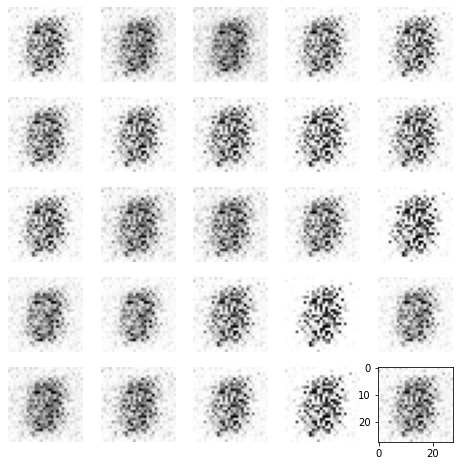

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.11it/s]


Epoch 6 of 100 with 10.70 s
Generator loss: 2.46833456, Discriminator loss: 1.06730039


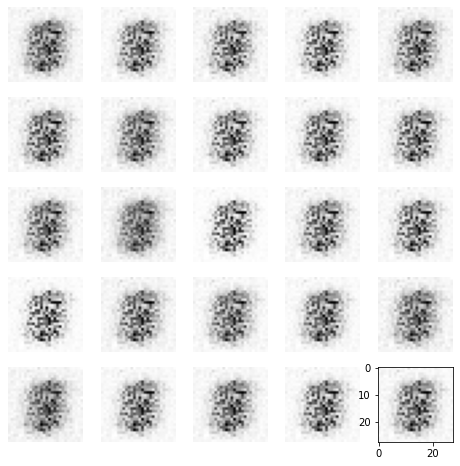

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 58.61it/s]


Epoch 7 of 100 with 10.24 s
Generator loss: 9.08419012, Discriminator loss: 1.06256677


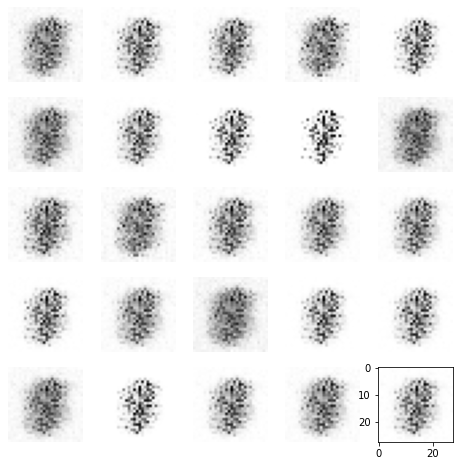

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 57.51it/s]


Epoch 8 of 100 with 10.44 s
Generator loss: 3.15788709, Discriminator loss: 0.88860798


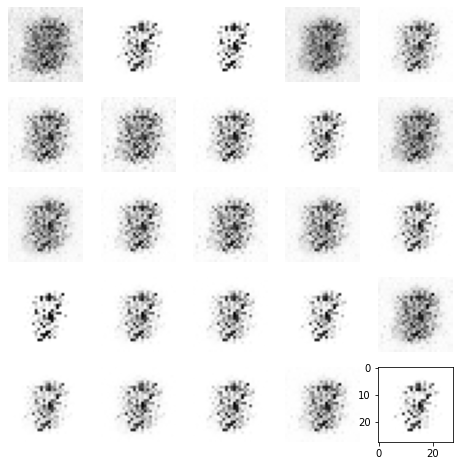

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 57.00it/s]


Epoch 9 of 100 with 10.53 s
Generator loss: 2.24417535, Discriminator loss: 0.85066119


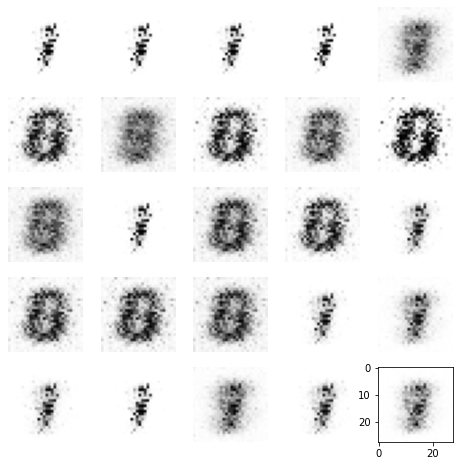

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 58.09it/s]


Epoch 10 of 100 with 10.33 s
Generator loss: 2.39997821, Discriminator loss: 0.84639889


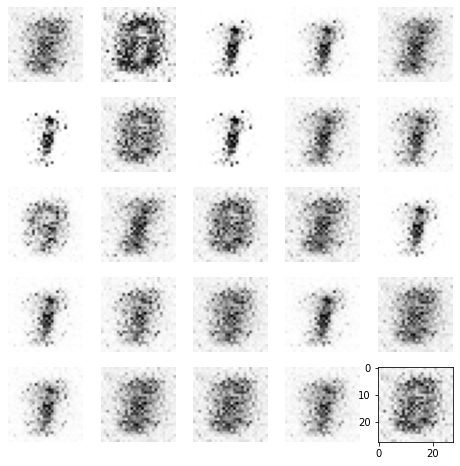

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 58.40it/s]


Epoch 11 of 100 with 10.28 s
Generator loss: 1.86693464, Discriminator loss: 0.92244784


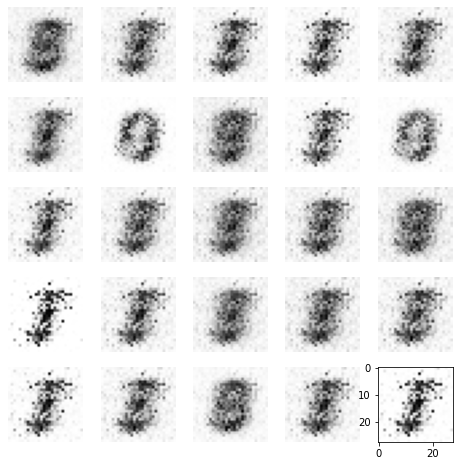

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 57.19it/s]


Epoch 12 of 100 with 10.49 s
Generator loss: 2.47572051, Discriminator loss: 0.64241314


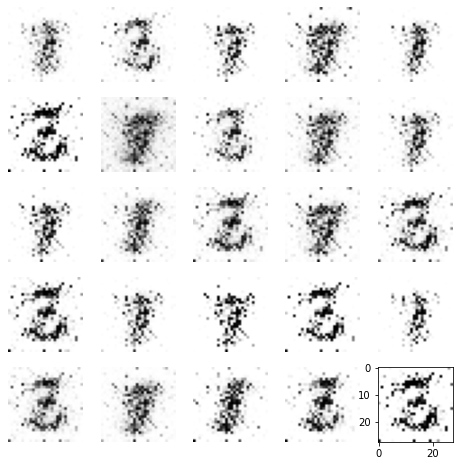

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.11it/s]


Epoch 13 of 100 with 10.69 s
Generator loss: 2.92871283, Discriminator loss: 0.76250840


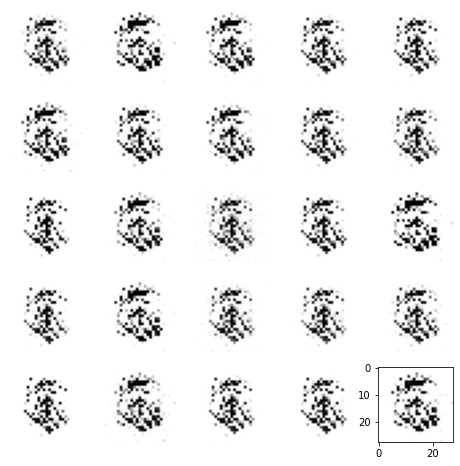

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 58.07it/s]


Epoch 14 of 100 with 10.33 s
Generator loss: 3.63163291, Discriminator loss: 0.55119807


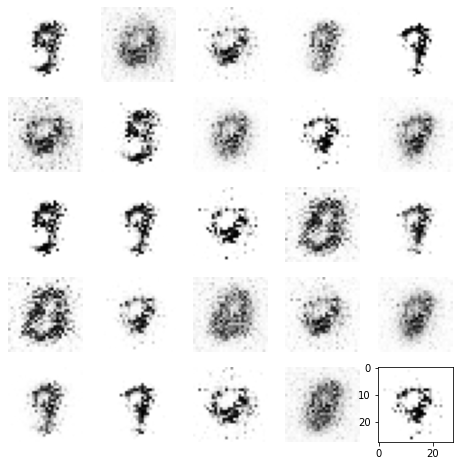

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.22it/s]


Epoch 15 of 100 with 10.68 s
Generator loss: 2.57745701, Discriminator loss: 0.77460946


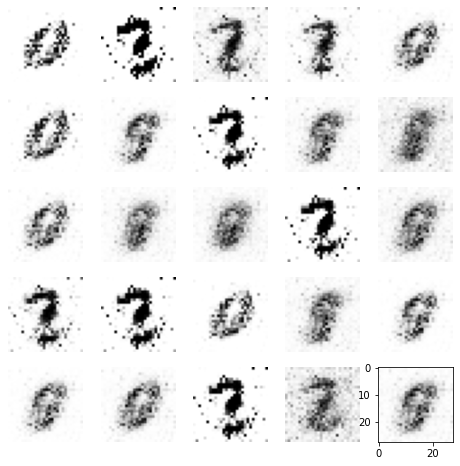

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.99it/s]


Epoch 16 of 100 with 10.72 s
Generator loss: 2.53409462, Discriminator loss: 0.71219665


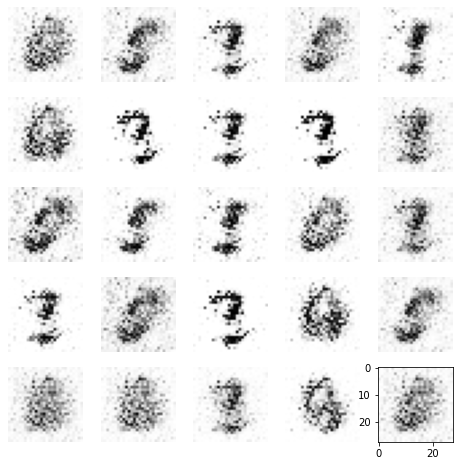

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.04it/s]


Epoch 17 of 100 with 10.71 s
Generator loss: 3.03718052, Discriminator loss: 0.70483562


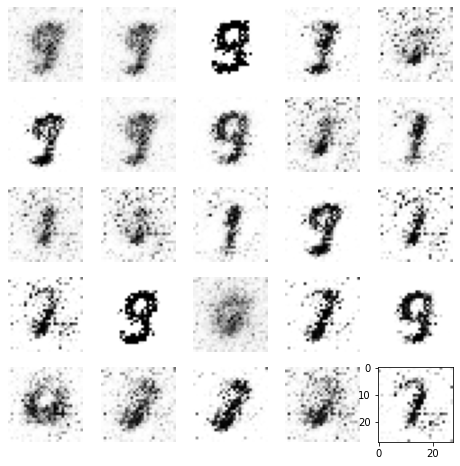

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.27it/s]


Epoch 18 of 100 with 10.86 s
Generator loss: 2.80045447, Discriminator loss: 0.66930763


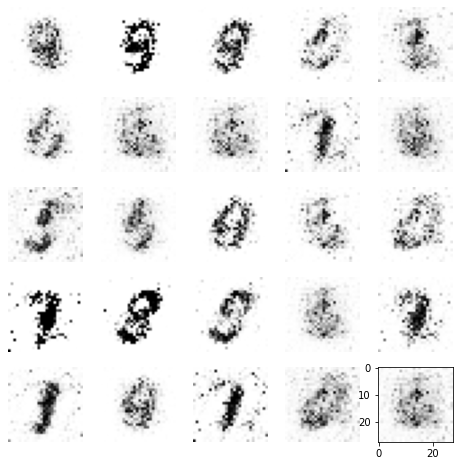

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.63it/s]


Epoch 19 of 100 with 10.60 s
Generator loss: 2.60631299, Discriminator loss: 0.70668586


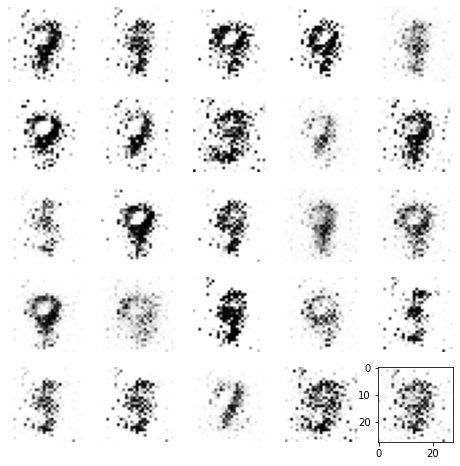

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 57.68it/s]


Epoch 20 of 100 with 10.40 s
Generator loss: 3.08594287, Discriminator loss: 0.71400131


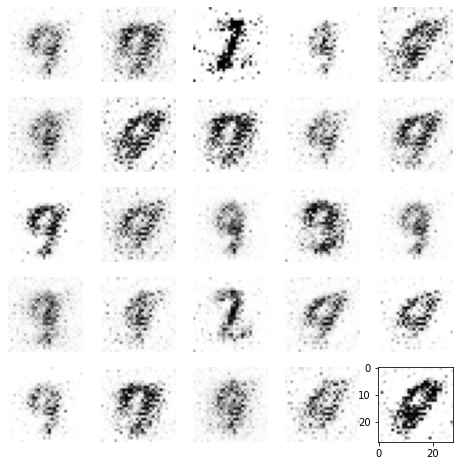

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 54.77it/s]


Epoch 21 of 100 with 10.96 s
Generator loss: 2.58276746, Discriminator loss: 0.72455114


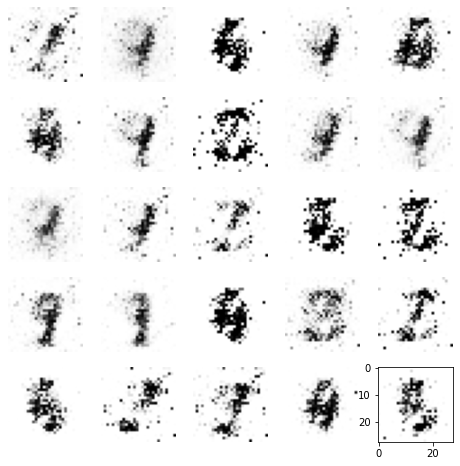

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.49it/s]


Epoch 22 of 100 with 10.63 s
Generator loss: 2.72796414, Discriminator loss: 0.69579511


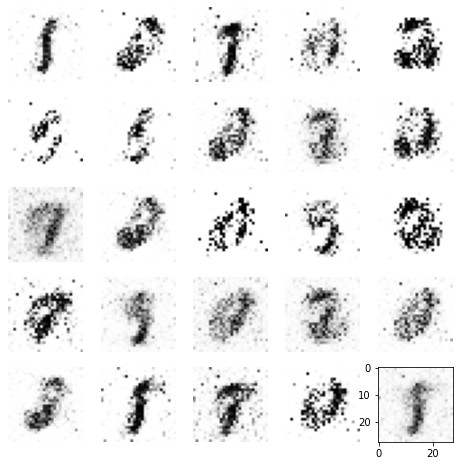

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 58.64it/s]


Epoch 23 of 100 with 10.23 s
Generator loss: 2.96090397, Discriminator loss: 0.68474382


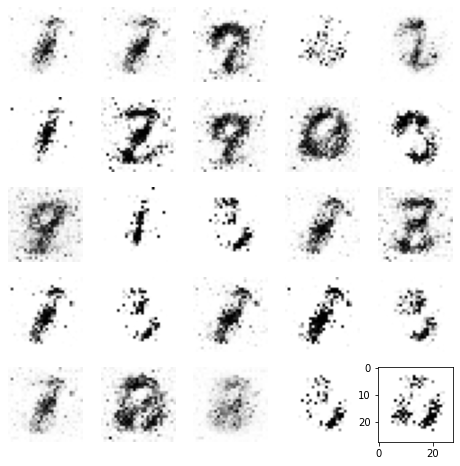

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 57.84it/s]


Epoch 24 of 100 with 10.38 s
Generator loss: 2.48008056, Discriminator loss: 0.69633349


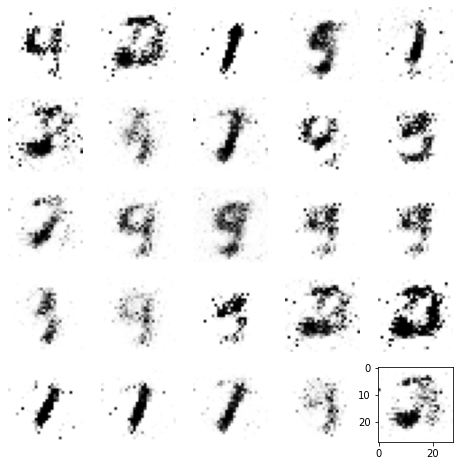

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 58.97it/s]


Epoch 25 of 100 with 10.18 s
Generator loss: 2.55456775, Discriminator loss: 0.72973595


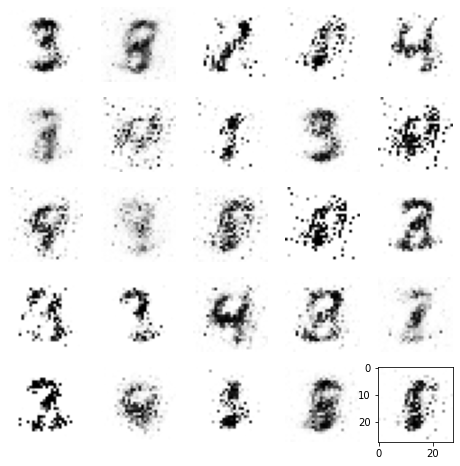

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.85it/s]


Epoch 26 of 100 with 10.56 s
Generator loss: 2.49127708, Discriminator loss: 0.67473090


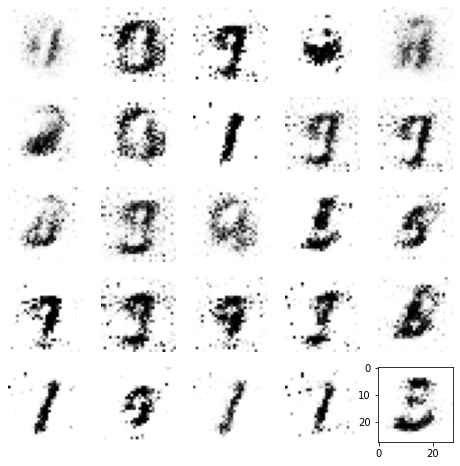

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 57.67it/s]


Epoch 27 of 100 with 10.41 s
Generator loss: 2.60175123, Discriminator loss: 0.64171062


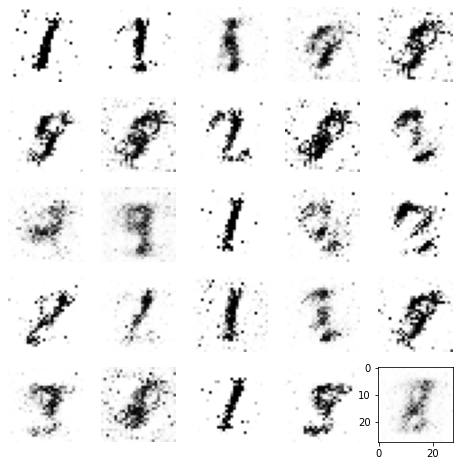

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 57.76it/s]


Epoch 28 of 100 with 10.39 s
Generator loss: 2.66462152, Discriminator loss: 0.62371612


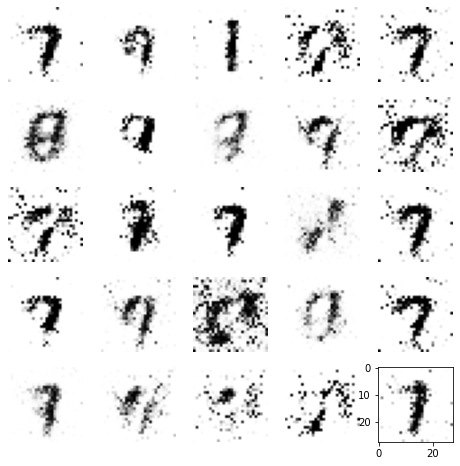

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 57.39it/s]


Epoch 29 of 100 with 10.46 s
Generator loss: 2.52649769, Discriminator loss: 0.63297376


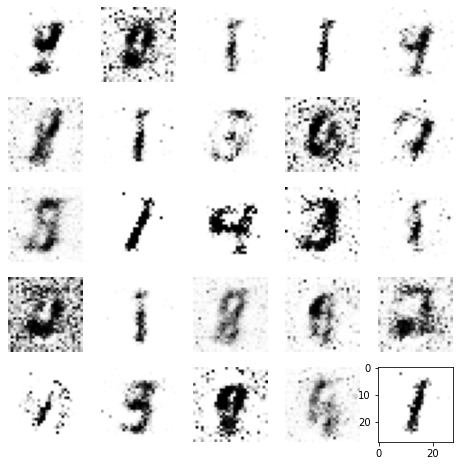

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 57.81it/s]


Epoch 30 of 100 with 10.38 s
Generator loss: 2.30707270, Discriminator loss: 0.67135078


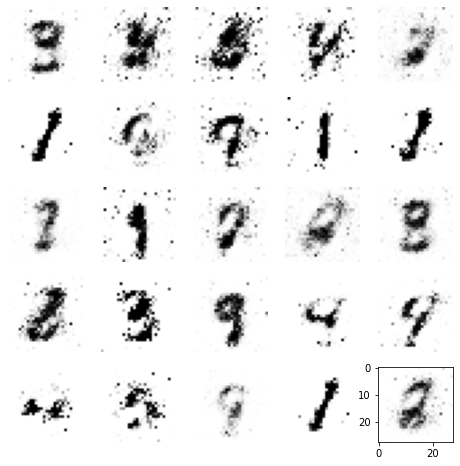

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 57.73it/s]


Epoch 31 of 100 with 10.40 s
Generator loss: 2.29748440, Discriminator loss: 0.76434715


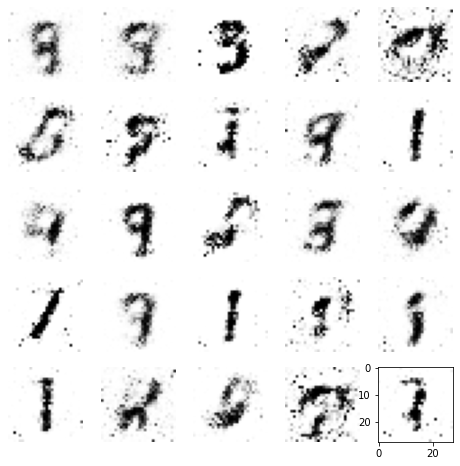

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 59.37it/s]


Epoch 32 of 100 with 10.11 s
Generator loss: 2.22851542, Discriminator loss: 0.70672171


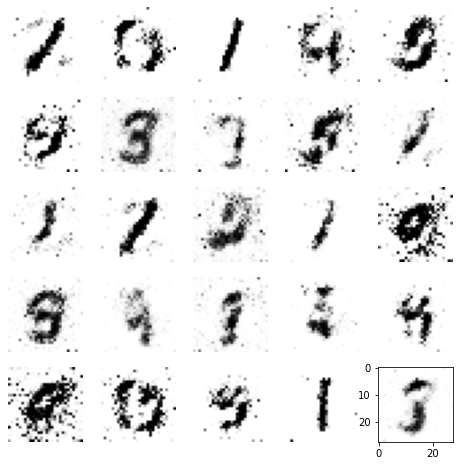

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 58.51it/s]


Epoch 33 of 100 with 10.26 s
Generator loss: 2.23501334, Discriminator loss: 0.75351570


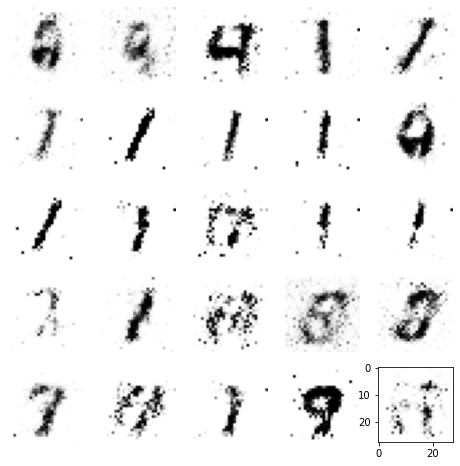

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 57.31it/s]


Epoch 34 of 100 with 10.47 s
Generator loss: 2.39797391, Discriminator loss: 0.69624030


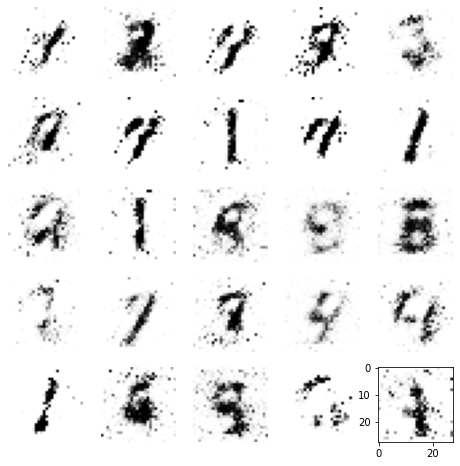

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 58.52it/s]


Epoch 35 of 100 with 10.26 s
Generator loss: 2.25443907, Discriminator loss: 0.71353973


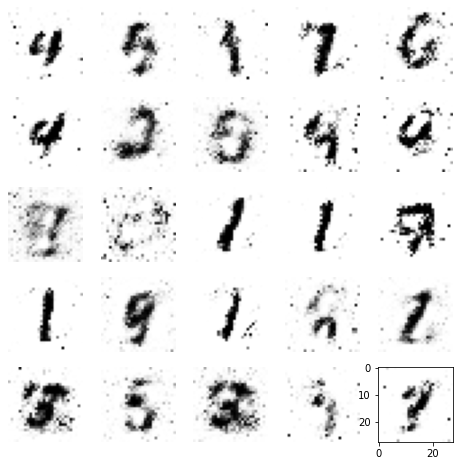

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 59.58it/s]


Epoch 36 of 100 with 10.07 s
Generator loss: 2.15456127, Discriminator loss: 0.73776622


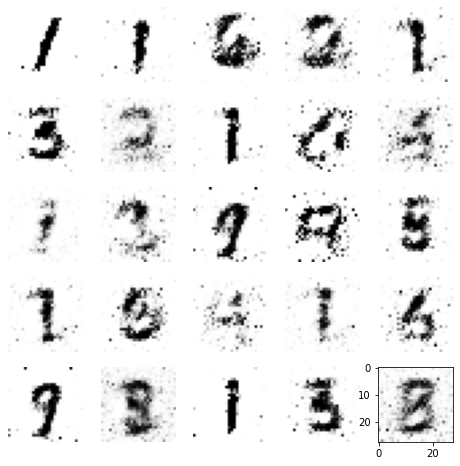

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 58.33it/s]


Epoch 37 of 100 with 10.29 s
Generator loss: 2.08899416, Discriminator loss: 0.74866691


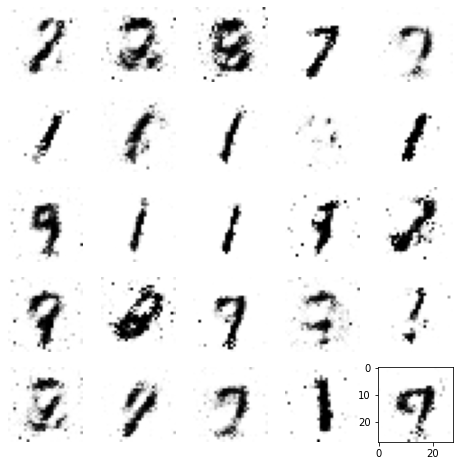

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 58.26it/s]


Epoch 38 of 100 with 10.30 s
Generator loss: 2.00290248, Discriminator loss: 0.77878078


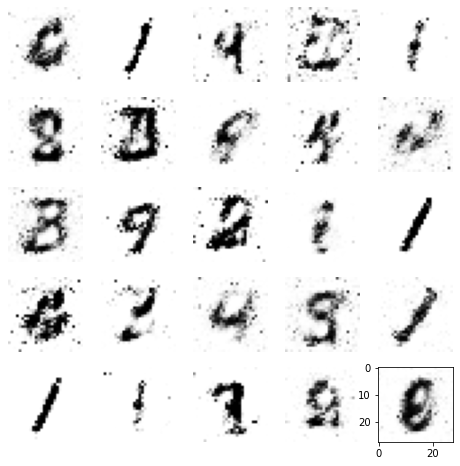

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 59.18it/s]


Epoch 39 of 100 with 10.14 s
Generator loss: 1.98382704, Discriminator loss: 0.78806577


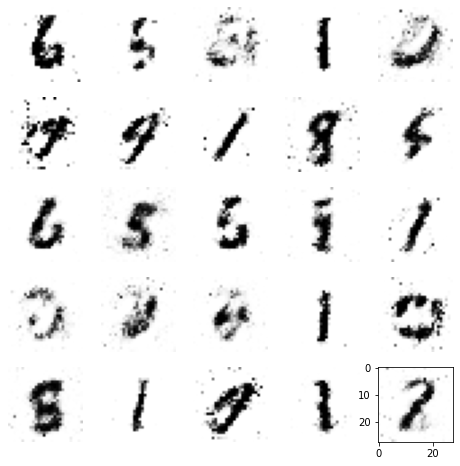

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 57.63it/s]


Epoch 40 of 100 with 10.41 s
Generator loss: 1.89158693, Discriminator loss: 0.80953093


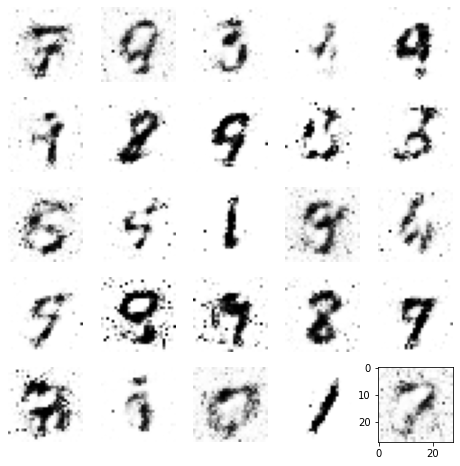

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 58.50it/s]


Epoch 41 of 100 with 10.26 s
Generator loss: 1.96182442, Discriminator loss: 0.80098788


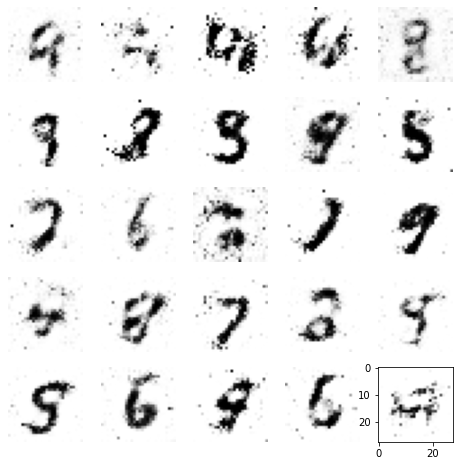

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 58.28it/s]


Epoch 42 of 100 with 10.30 s
Generator loss: 1.81471974, Discriminator loss: 0.84014310


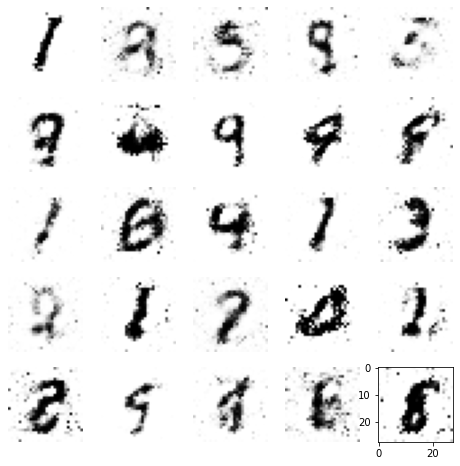

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 58.51it/s]


Epoch 43 of 100 with 10.26 s
Generator loss: 1.84919040, Discriminator loss: 0.82460084


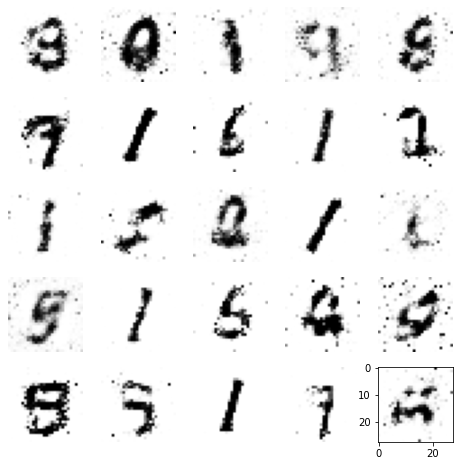

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 54.96it/s]


Epoch 44 of 100 with 10.92 s
Generator loss: 1.87926960, Discriminator loss: 0.82140659


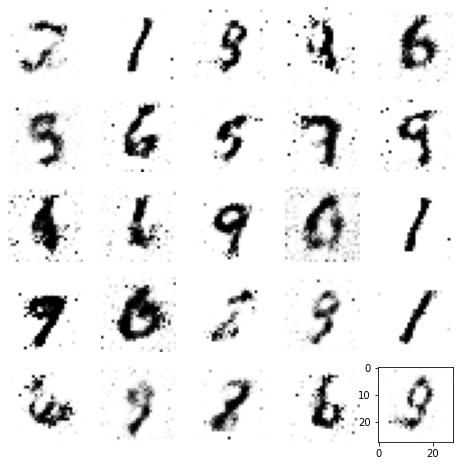

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.86it/s]


Epoch 45 of 100 with 10.74 s
Generator loss: 1.84016521, Discriminator loss: 0.83388956


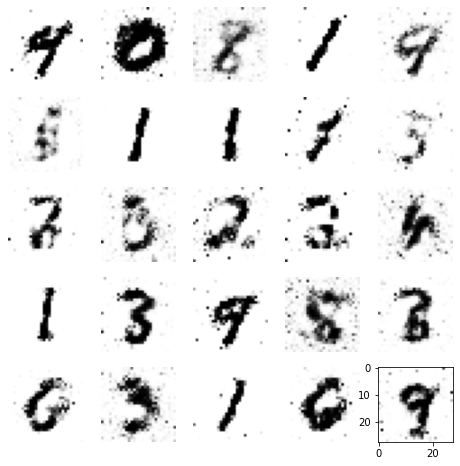

100%|██████████████████████████████████████████████████████████████| 600/600 [00:11<00:00, 51.59it/s]


Epoch 46 of 100 with 11.63 s
Generator loss: 1.80664380, Discriminator loss: 0.83235261


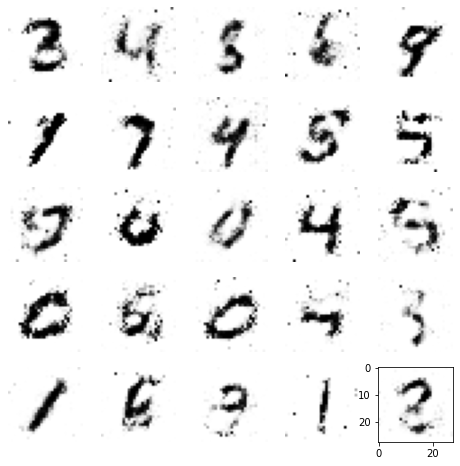

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.49it/s]


Epoch 47 of 100 with 10.62 s
Generator loss: 1.81814391, Discriminator loss: 0.83573476


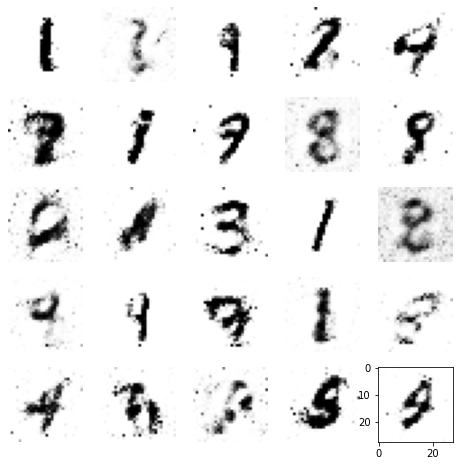

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.52it/s]


Epoch 48 of 100 with 10.81 s
Generator loss: 1.83701329, Discriminator loss: 0.82841886


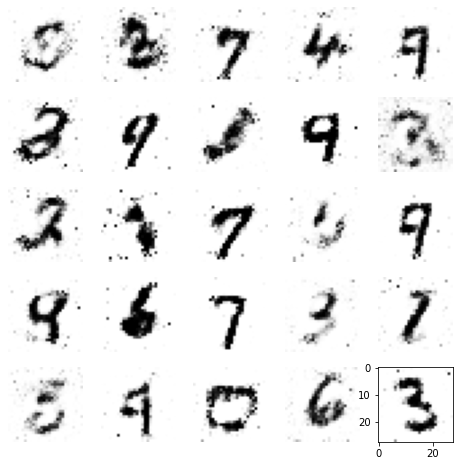

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.72it/s]


Epoch 49 of 100 with 10.77 s
Generator loss: 1.86374214, Discriminator loss: 0.83690727


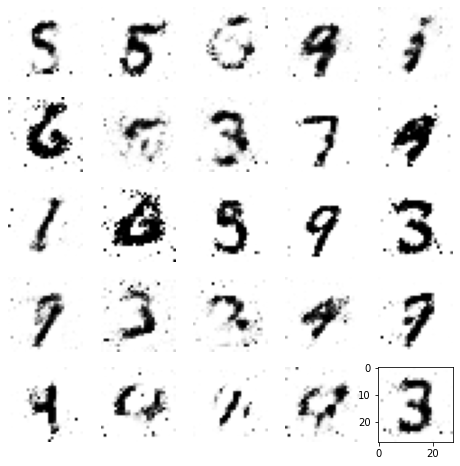

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.95it/s]


Epoch 50 of 100 with 10.73 s
Generator loss: 1.79166806, Discriminator loss: 0.85201853


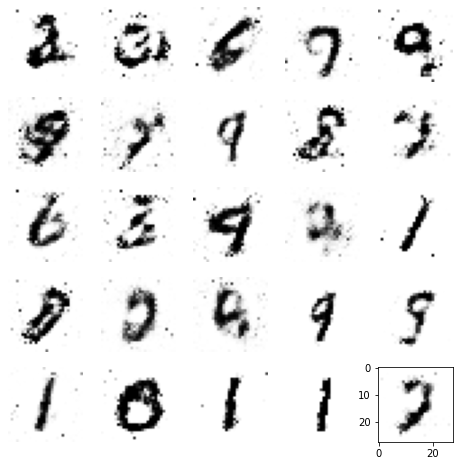

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.36it/s]


Epoch 51 of 100 with 10.65 s
Generator loss: 1.71724195, Discriminator loss: 0.87606766


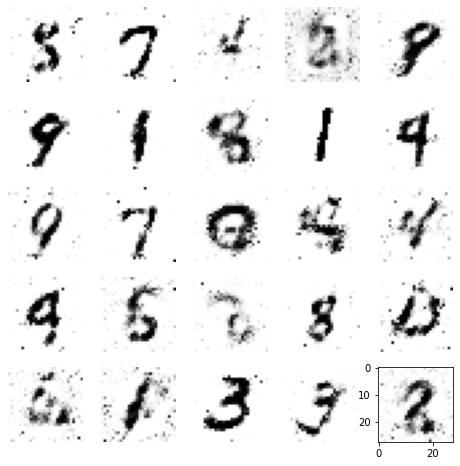

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.04it/s]


Epoch 52 of 100 with 10.71 s
Generator loss: 1.67928014, Discriminator loss: 0.88275296


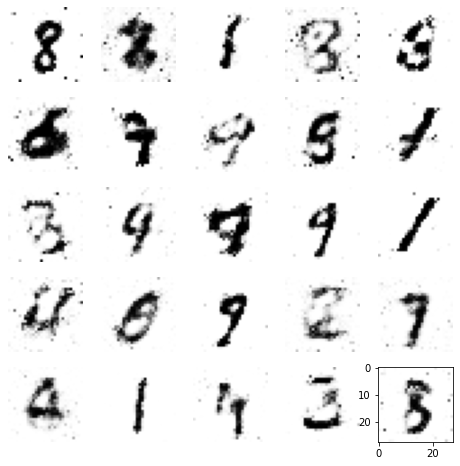

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.24it/s]


Epoch 53 of 100 with 10.67 s
Generator loss: 1.67495625, Discriminator loss: 0.88530259


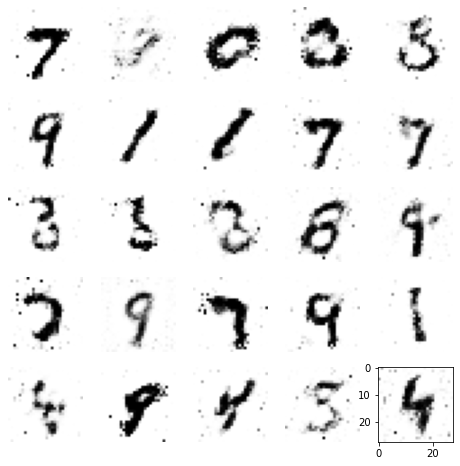

100%|██████████████████████████████████████████████████████████████| 600/600 [00:11<00:00, 53.65it/s]


Epoch 54 of 100 with 11.19 s
Generator loss: 1.65372677, Discriminator loss: 0.89843152


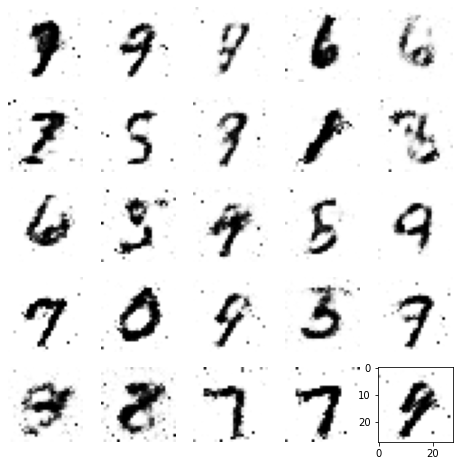

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 54.85it/s]


Epoch 55 of 100 with 10.94 s
Generator loss: 1.60993758, Discriminator loss: 0.91259477


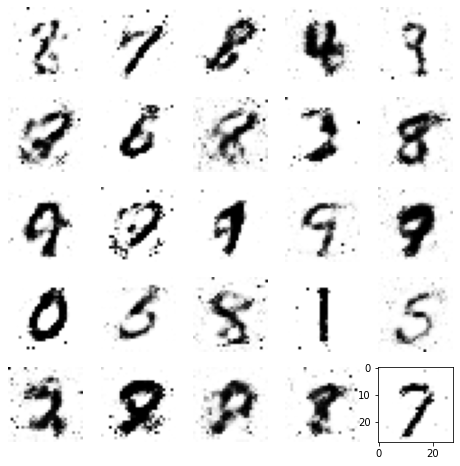

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 54.99it/s]


Epoch 56 of 100 with 10.91 s
Generator loss: 1.62677816, Discriminator loss: 0.91310074


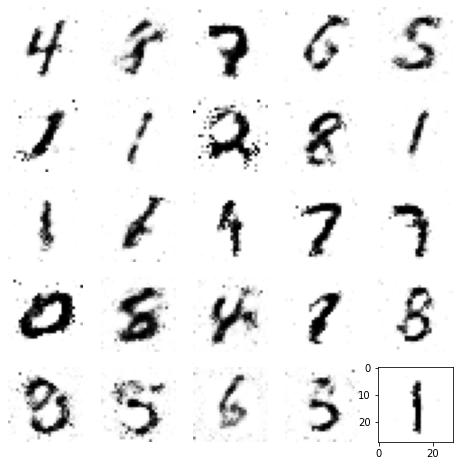

100%|██████████████████████████████████████████████████████████████| 600/600 [00:11<00:00, 53.50it/s]


Epoch 57 of 100 with 11.22 s
Generator loss: 1.60703973, Discriminator loss: 0.91320685


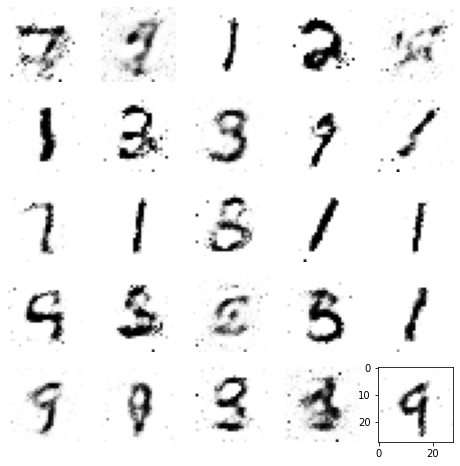

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.09it/s]


Epoch 58 of 100 with 10.89 s
Generator loss: 1.57770008, Discriminator loss: 0.93141635


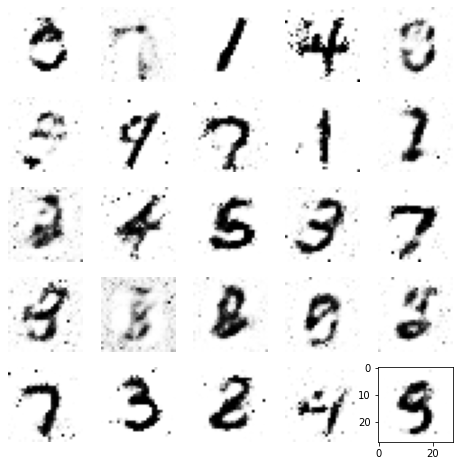

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.70it/s]


Epoch 59 of 100 with 10.77 s
Generator loss: 1.58543024, Discriminator loss: 0.92227514


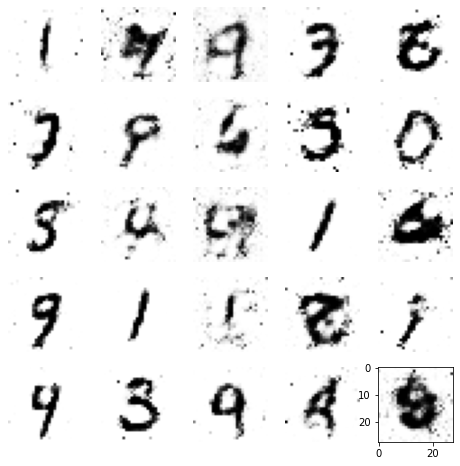

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 54.63it/s]


Epoch 60 of 100 with 10.99 s
Generator loss: 1.54674789, Discriminator loss: 0.93509772


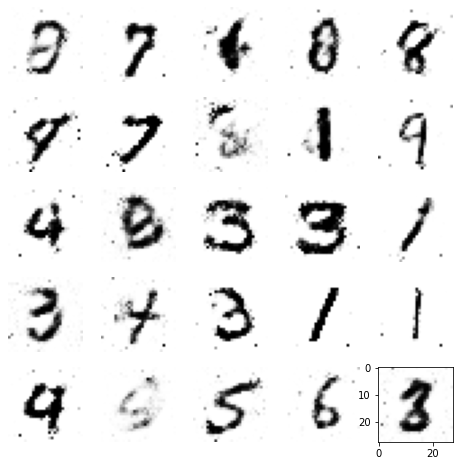

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.65it/s]


Epoch 61 of 100 with 10.78 s
Generator loss: 1.53072112, Discriminator loss: 0.94665214


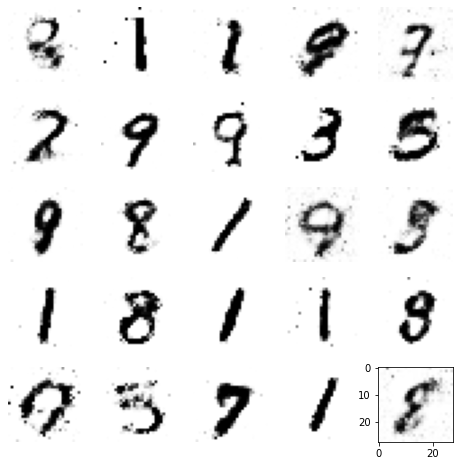

100%|██████████████████████████████████████████████████████████████| 600/600 [00:11<00:00, 54.53it/s]


Epoch 62 of 100 with 11.01 s
Generator loss: 1.57420651, Discriminator loss: 0.94061825


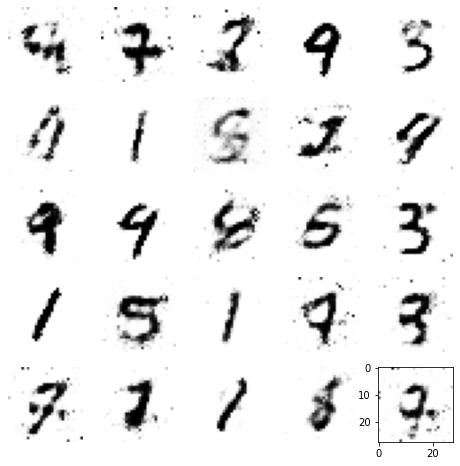

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.13it/s]


Epoch 63 of 100 with 10.89 s
Generator loss: 1.50877501, Discriminator loss: 0.94980367


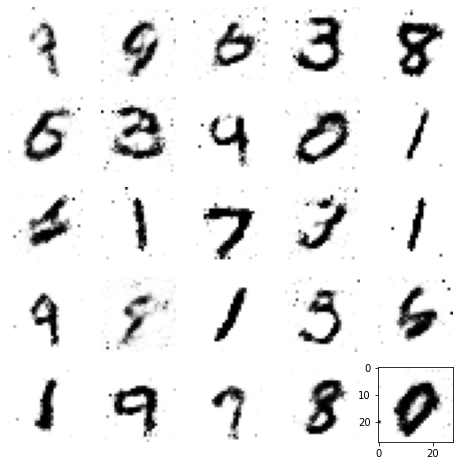

100%|██████████████████████████████████████████████████████████████| 600/600 [00:11<00:00, 54.47it/s]


Epoch 64 of 100 with 11.02 s
Generator loss: 1.52366866, Discriminator loss: 0.95742695


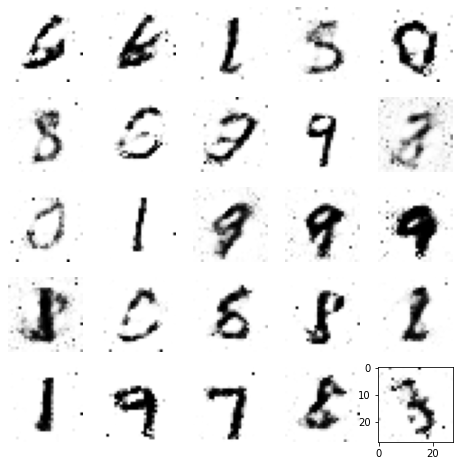

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.65it/s]


Epoch 65 of 100 with 10.59 s
Generator loss: 1.53002810, Discriminator loss: 0.95190485


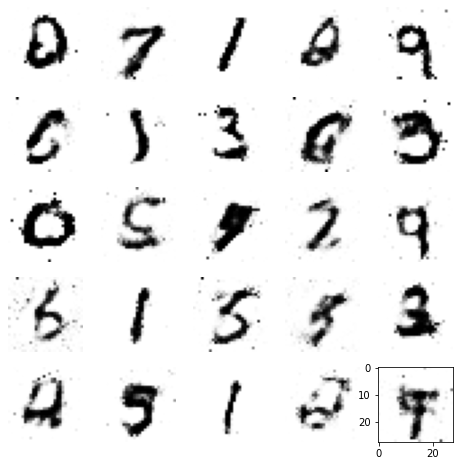

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.30it/s]


Epoch 66 of 100 with 10.85 s
Generator loss: 1.51739339, Discriminator loss: 0.95447508


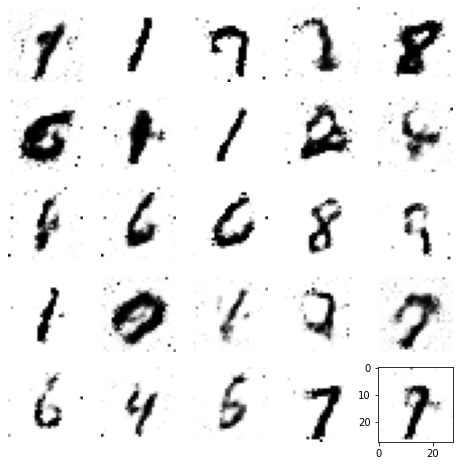

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.96it/s]


Epoch 67 of 100 with 10.73 s
Generator loss: 1.51463079, Discriminator loss: 0.95816234


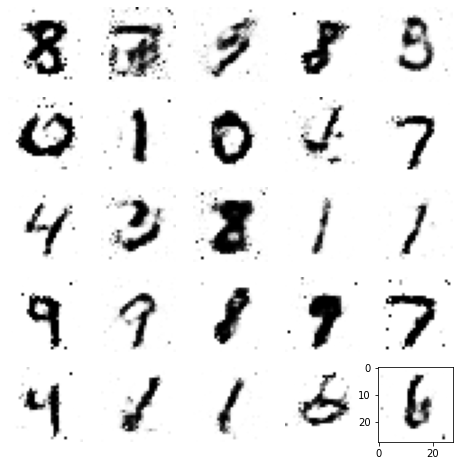

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.74it/s]


Epoch 68 of 100 with 10.77 s
Generator loss: 1.52982040, Discriminator loss: 0.94421341


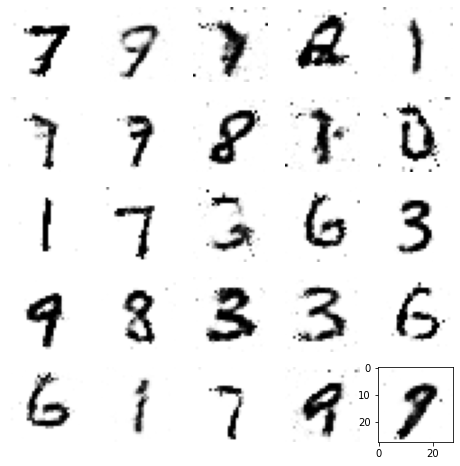

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.14it/s]


Epoch 69 of 100 with 10.88 s
Generator loss: 1.51949936, Discriminator loss: 0.95754429


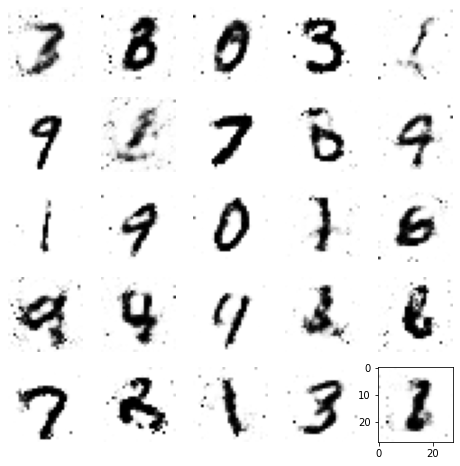

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.21it/s]


Epoch 70 of 100 with 10.87 s
Generator loss: 1.52074216, Discriminator loss: 0.96148676


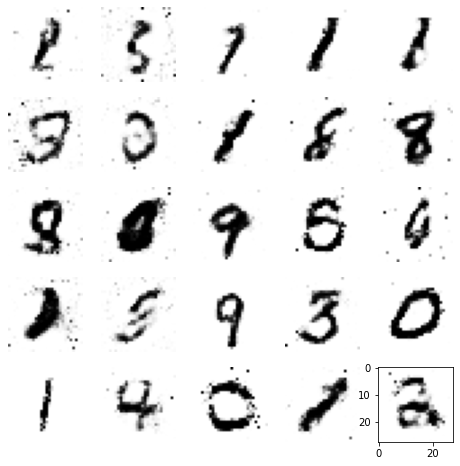

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 54.84it/s]


Epoch 71 of 100 with 10.94 s
Generator loss: 1.50833128, Discriminator loss: 0.96394606


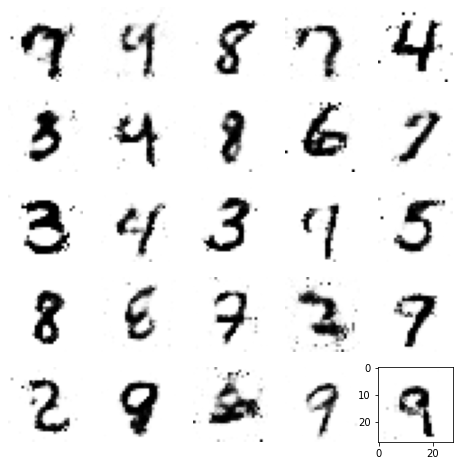

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 54.88it/s]


Epoch 72 of 100 with 10.94 s
Generator loss: 1.48126023, Discriminator loss: 0.97573792


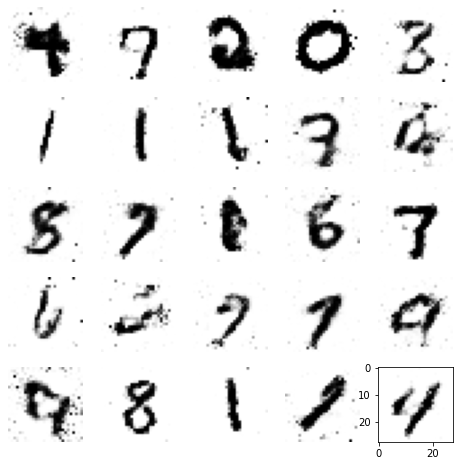

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.59it/s]


Epoch 73 of 100 with 10.80 s
Generator loss: 1.47092040, Discriminator loss: 0.97770498


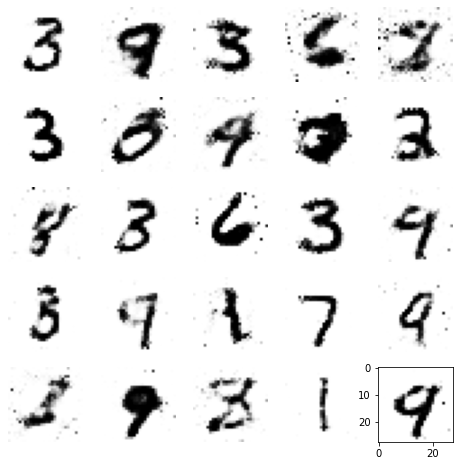

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.51it/s]


Epoch 74 of 100 with 10.62 s
Generator loss: 1.48234405, Discriminator loss: 0.97458370


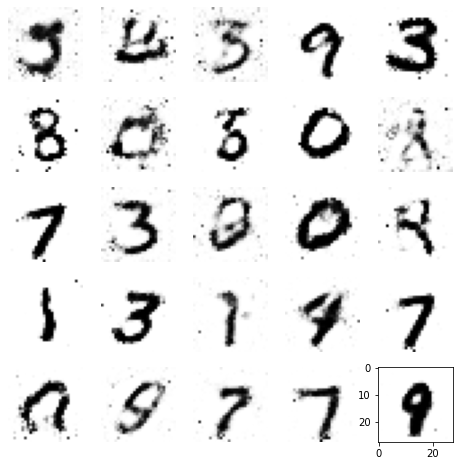

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.23it/s]


Epoch 75 of 100 with 10.87 s
Generator loss: 1.47867820, Discriminator loss: 0.98187560


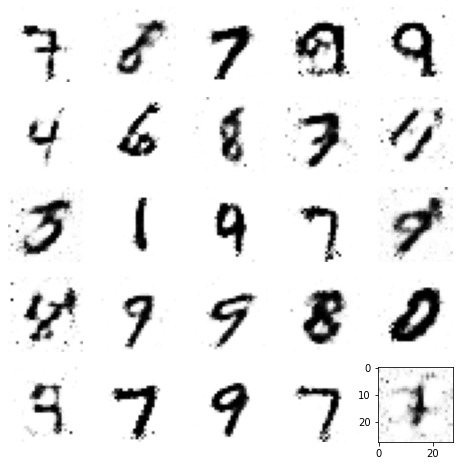

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.32it/s]


Epoch 76 of 100 with 10.85 s
Generator loss: 1.46155908, Discriminator loss: 0.97960833


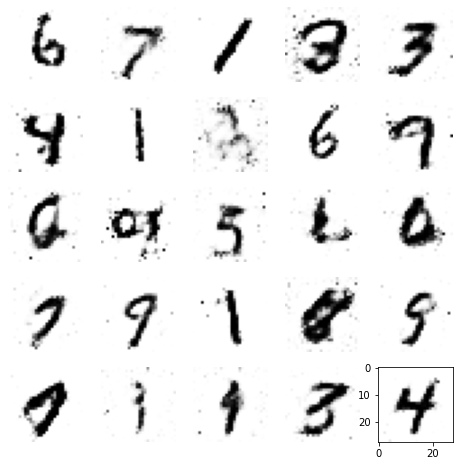

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.09it/s]


Epoch 77 of 100 with 10.89 s
Generator loss: 1.45701813, Discriminator loss: 0.98976660


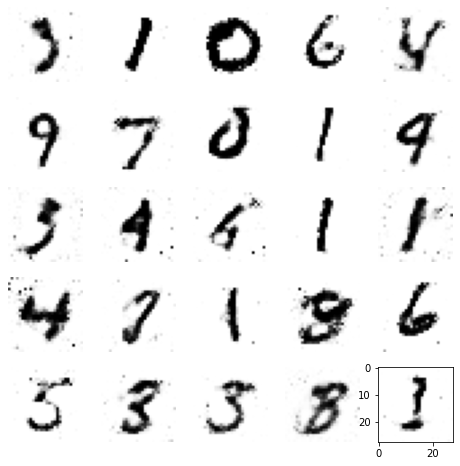

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.40it/s]


Epoch 78 of 100 with 10.64 s
Generator loss: 1.46263505, Discriminator loss: 0.98281591


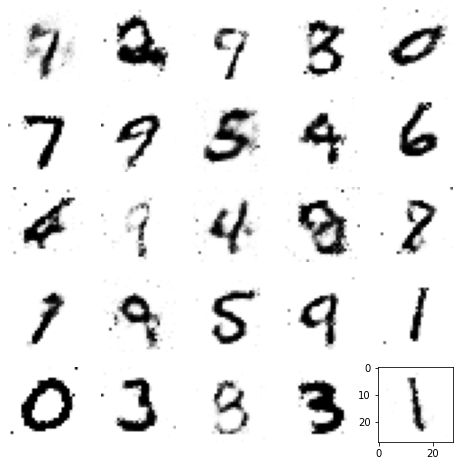

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.71it/s]


Epoch 79 of 100 with 10.77 s
Generator loss: 1.44874283, Discriminator loss: 0.99060742


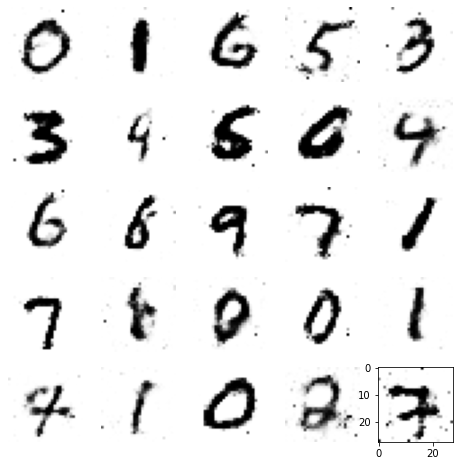

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.77it/s]


Epoch 80 of 100 with 10.76 s
Generator loss: 1.45118385, Discriminator loss: 0.98508194


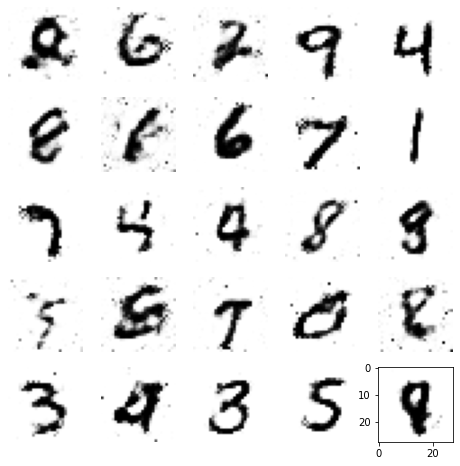

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.89it/s]


Epoch 81 of 100 with 10.74 s
Generator loss: 1.46565176, Discriminator loss: 0.99248770


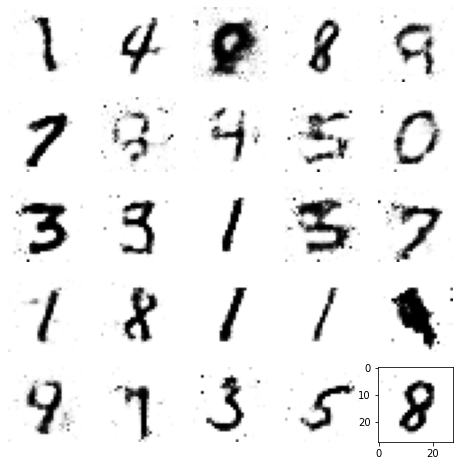

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.26it/s]


Epoch 82 of 100 with 10.67 s
Generator loss: 1.43146611, Discriminator loss: 0.99251114


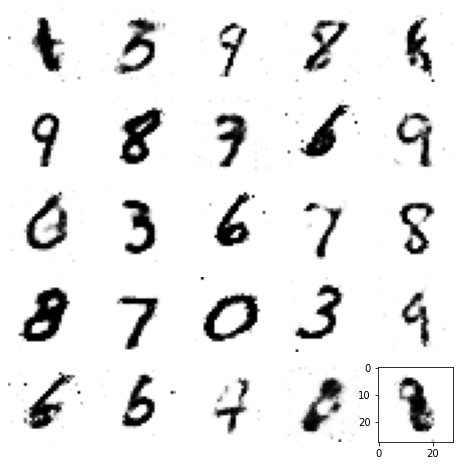

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 54.98it/s]


Epoch 83 of 100 with 10.92 s
Generator loss: 1.45182307, Discriminator loss: 0.99372251


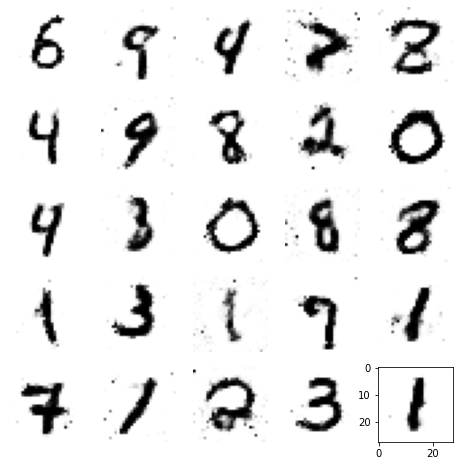

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.75it/s]


Epoch 84 of 100 with 10.58 s
Generator loss: 1.43401354, Discriminator loss: 0.99439948


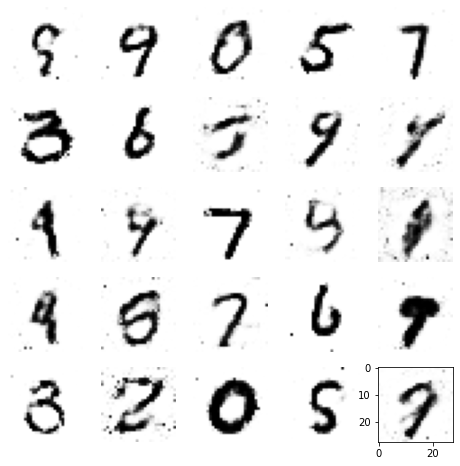

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.65it/s]


Epoch 85 of 100 with 10.59 s
Generator loss: 1.45406073, Discriminator loss: 0.99457382


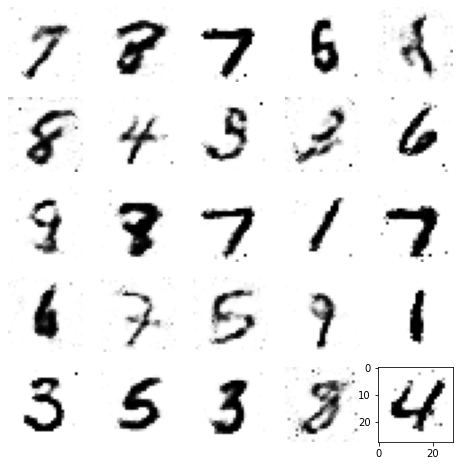

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.09it/s]


Epoch 86 of 100 with 10.70 s
Generator loss: 1.42074682, Discriminator loss: 1.00050702


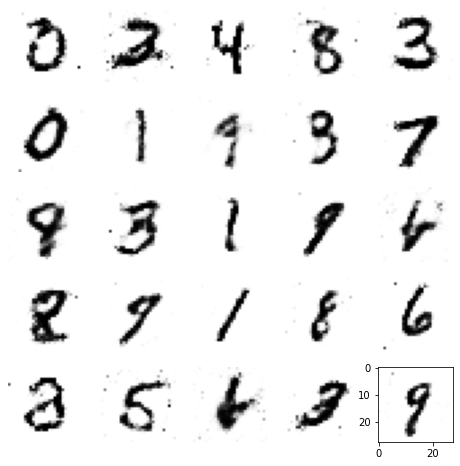

100%|██████████████████████████████████████████████████████████████| 600/600 [00:11<00:00, 53.26it/s]


Epoch 87 of 100 with 11.27 s
Generator loss: 1.44703228, Discriminator loss: 0.99330448


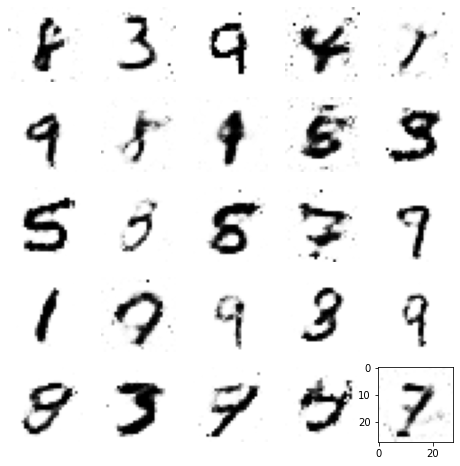

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.93it/s]


Epoch 88 of 100 with 10.73 s
Generator loss: 1.42133841, Discriminator loss: 0.99661749


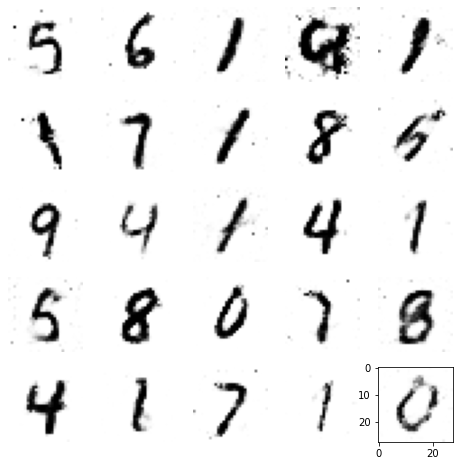

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.90it/s]


Epoch 89 of 100 with 10.74 s
Generator loss: 1.46440731, Discriminator loss: 0.98983342


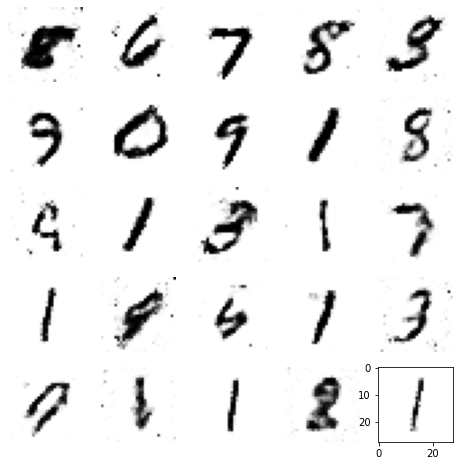

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.70it/s]


Epoch 90 of 100 with 10.78 s
Generator loss: 1.43970013, Discriminator loss: 0.99740784


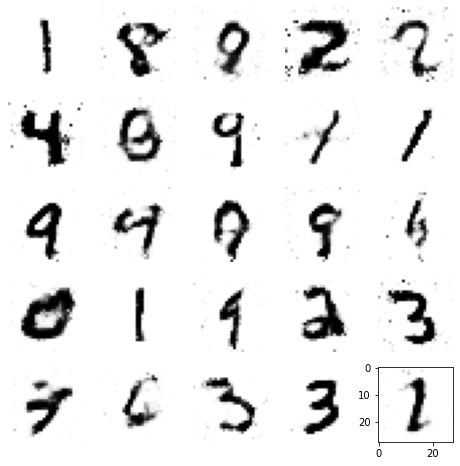

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.30it/s]


Epoch 91 of 100 with 10.85 s
Generator loss: 1.43523753, Discriminator loss: 0.99932411


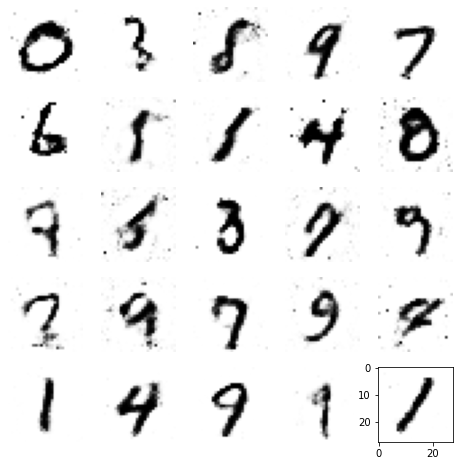

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 54.84it/s]


Epoch 92 of 100 with 10.94 s
Generator loss: 1.42105942, Discriminator loss: 1.00585762


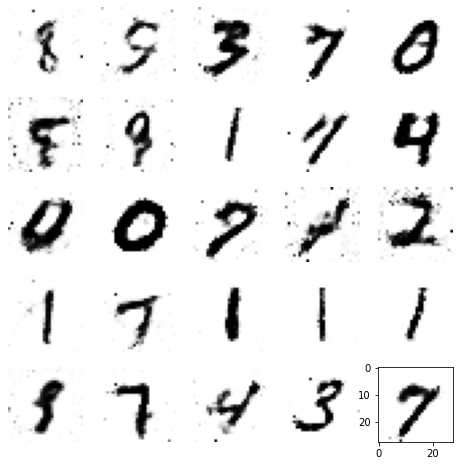

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 57.25it/s]


Epoch 93 of 100 with 10.48 s
Generator loss: 1.44907787, Discriminator loss: 0.99909006


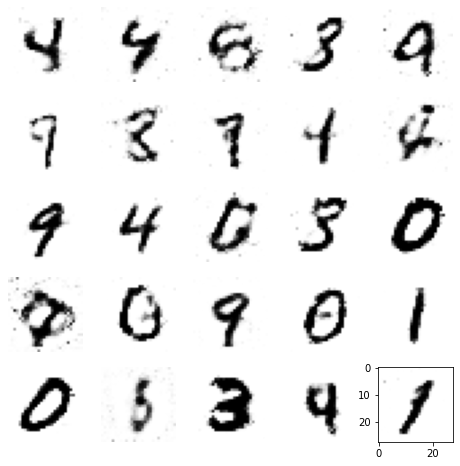

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.74it/s]


Epoch 94 of 100 with 10.58 s
Generator loss: 1.43667789, Discriminator loss: 0.99980614


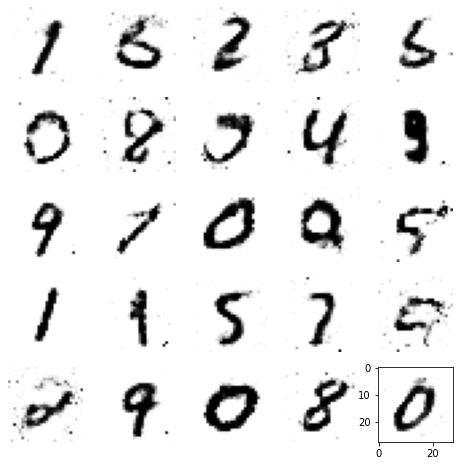

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.65it/s]


Epoch 95 of 100 with 10.59 s
Generator loss: 1.44154147, Discriminator loss: 0.99631544


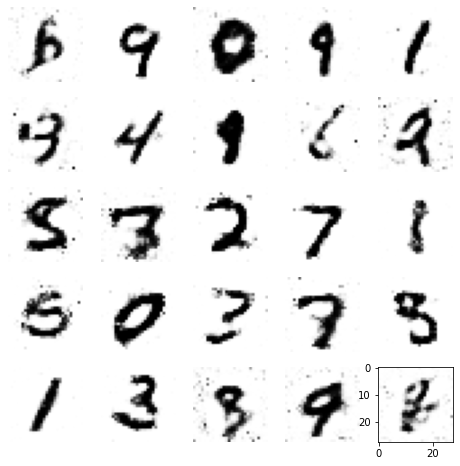

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 56.58it/s]


Epoch 96 of 100 with 10.61 s
Generator loss: 1.45674972, Discriminator loss: 0.98894368


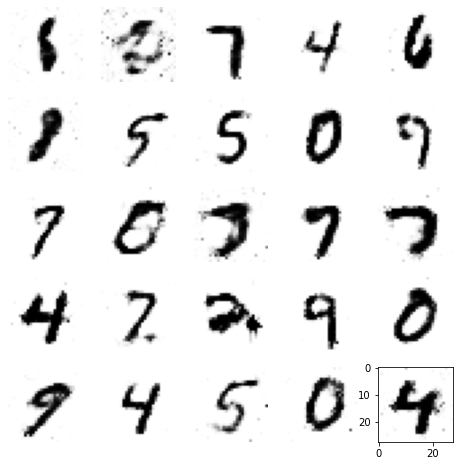

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.01it/s]


Epoch 97 of 100 with 10.91 s
Generator loss: 1.43273655, Discriminator loss: 0.99777975


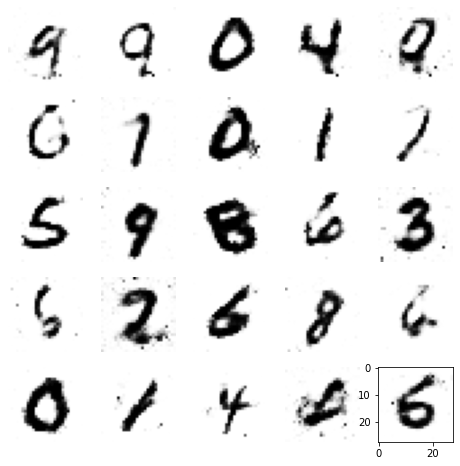

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 57.05it/s]


Epoch 98 of 100 with 10.52 s
Generator loss: 1.41855381, Discriminator loss: 1.00355287


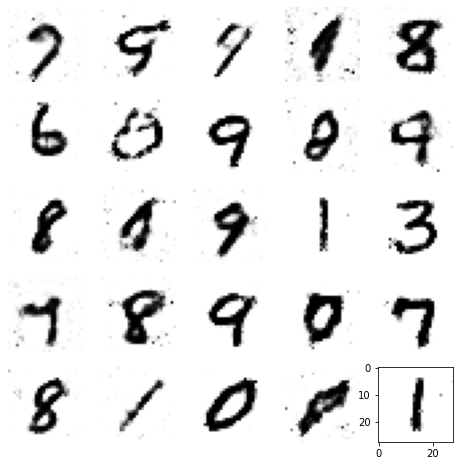

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 55.71it/s]


Epoch 99 of 100 with 10.77 s
Generator loss: 1.42148748, Discriminator loss: 1.00118452


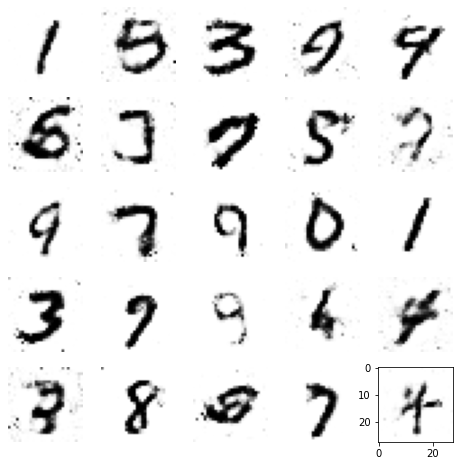

100%|██████████████████████████████████████████████████████████████| 600/600 [00:10<00:00, 57.02it/s]


Epoch 100 of 100 with 10.52 s
Generator loss: 1.43608329, Discriminator loss: 0.99599846


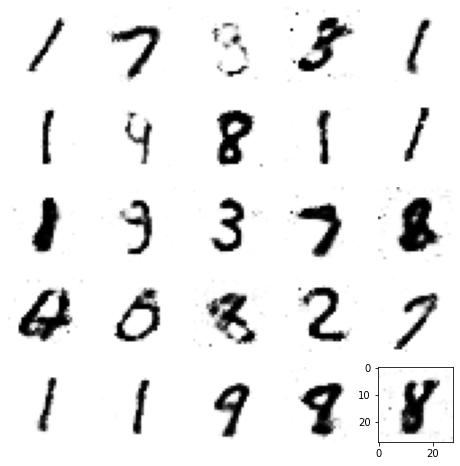

Avg per epoch ptime: 10.65, total 100 epochs ptime: 1137.99
Training finish!... saving training results


In [34]:

# initialise the device for training, if gpu is available, device = 'cuda', else: device = 'cpu'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
data_dir = './MNIST_data/'
save_dir = './MNIST_GAN_results/'
image_save_dir = 'MNIST_GAN_results/results'

# create folder if not exist
if not os.path.exists(save_dir):
    os.mkdir(save_dir)
if not os.path.exists(image_save_dir):
    os.mkdir(image_save_dir)

# training parameters
batch_size = 100
learning_rate = 0.0002
epochs = 100

# parameters for Models
image_size = 28
G_input_dim = 100
G_output_dim = image_size * image_size
D_input_dim = image_size * image_size
D_output_dim = 1

# construct the dataset and data loader
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize(mean=(0.5,), std=(0.5,))])
train_data = datasets.MNIST(root=data_dir, train=True, transform=transform, download=True)
train_loader = DataLoader(dataset=train_data, batch_size=batch_size, shuffle=True, num_workers=8)

# declare the generator and discriminator networks    
G_net = Generator(G_input_dim, G_output_dim).to(device)
D_net = Discriminator(D_input_dim, D_output_dim).to(device)

# Binary Cross Entropy Loss function
criterion = nn.BCELoss().to(device)

# Initialise the Optimizers
G_optimizer = torch.optim.Adam(G_net.parameters(), lr=learning_rate)
D_optimizer = torch.optim.Adam(D_net.parameters(), lr=learning_rate)

# tracking variables
train_hist = {}
train_hist['D_losses'] = []
train_hist['G_losses'] = []
train_hist['per_epoch_ptimes'] = []
train_hist['total_ptime'] = []

start_time = time.time()
# training loop
for epoch in range(epochs):
    G_net.train()
    D_net.train()
    Loss_G = []
    Loss_D = []
    epoch_start_time = time.time()
    for (image, _) in tqdm(train_loader):
        image = image.to(device)
        b_size = len(image)
        # creat real and fake labels
        real_label = torch.ones(b_size, 1).to(device)
        fake_label = torch.zeros(b_size, 1).to(device)

        # generate fake images 
        data_fake = G_net(create_noise(b_size, G_input_dim).to(device))
        data_real = image.view(b_size, D_input_dim)

        # --------train the discriminator network----------
        # compute the loss for real and fake images
        output_real = D_net(data_real)
        output_fake = D_net(data_fake)
        loss_real = criterion(output_real, real_label)
        loss_fake = criterion(output_fake, fake_label)
        loss_d = loss_real + loss_fake

        # back propagation
        D_optimizer.zero_grad()
        loss_d.backward()
        D_optimizer.step()

        # -------- train the generator network-----------
        data_fake = G_net(create_noise(b_size, G_input_dim).to(device))

        # compute the loss for generator network
        output_fake = D_net(data_fake)
        loss_g = criterion(output_fake, real_label)

        ## back propagation
        G_optimizer.zero_grad()
        loss_g.backward()
        G_optimizer.step()

        ## store the loss of each iter
        Loss_D.append(loss_d.item())
        Loss_G.append(loss_g.item())

    epoch_loss_g = np.mean(Loss_G)  # mean generator loss for the epoch
    epoch_loss_d = np.mean(Loss_D)  # mean discriminator loss for the epoch
    epoch_end_time = time.time()
    per_epoch_ptime = epoch_end_time - epoch_start_time

    print("Epoch %d of %d with %.2f s" % (epoch + 1, epochs, per_epoch_ptime))
    print("Generator loss: %.8f, Discriminator loss: %.8f" % (epoch_loss_g, epoch_loss_d))

    path = image_save_dir + '/MNIST_GAN_' + str(epoch + 1) + '.png'
    show_result(G_net, create_noise(25, 100).to(device), (epoch + 1), save=False, path=path, show=True)

    # record the loss for every epoch
    train_hist['G_losses'].append(epoch_loss_g)
    train_hist['D_losses'].append(epoch_loss_d)
    train_hist['per_epoch_ptimes'].append(per_epoch_ptime)

end_time = time.time()
total_ptime = end_time - start_time
train_hist['total_ptime'].append(total_ptime)

print('Avg per epoch ptime: %.2f, total %d epochs ptime: %.2f' % (
    np.mean(train_hist['per_epoch_ptimes']), epochs, total_ptime))
print("Training finish!... saving training results")
with open(save_dir + '/train_hist.pkl', 'wb') as f:
    pickle.dump(train_hist, f)
show_train_hist(train_hist, save=True, path=save_dir + '/MNIST_GAN_train_hist.png')